<a href="https://colab.research.google.com/github/MarkoArsenovic/PPPO2021/blob/main/Vezbe06.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Vežbe 06** Registracija fotografije

## Sadržaj

1. Uvod
2. Registracija medicinske fotografije pomoću *SimpleITK*-a
3. Poravnanje fotografije pomoću ECC algoritma
4. Poravnanje lica
5. Robusno podudaranje sa RANSAC algoritmom pomoću *Harris Corner Brief* deskriptora
6. Mozaikovanje fotografija (cilindrična panorama)
7. Preoblikovanje lica
8. Implementacija pretraživača fotografija - pronalaženje sličnosti između fotografije i skupa fotografija i izgradnja jednostavnog pretraživača fotografija

### Uvod

Registracija fotografije odnosi se na zadatak obrade fotografije čiji je cilj poravnanje ciljne fotografije sa izvornom fotografijom. Za cilj ima izračunavanje prostorne transformacije (funkcije) koja preslikava (neke) tačke sa jedne fotografije na odgovarajuće tačke na drugoj fotografiji. Često se pronalaženje transformacije sa jedne fotografije na drugu naziva poravnanjem, a zatim se zapravo izvođenje postupka izobličavanja fotografije pomoću procenjene transformacije naziva registracijom.

Postoje tri opšte filozofije koje se mogu uporediti da bi se utvrdilo poravnanje:
- Na osnovu intenziteta (uporedite stvarne vrednosti piksela sa jedne fotografije na drugu, na primer, sa međusobnim informacijama)
- Na osnovu segmentacije (registrujte binarnu segmentaciju)
- Na osnovi orijentira (ili obeležja) (označite ključne tačke na obe fotografije i izvedite transformaciju koja čini da se svaki par orijentira podudara)

Transformacije koje ćemo proceniti (da bismo registrovali fotografije) mogu biti bilo koje od sledećih vrsta:
- Rigidne (rotiranje, transliranje)
- Afine (rigidna + skaliranje i smicanje/iskošavanje)
- Deformabilne (slobodna forma = afine + vektorsko polje)

Moguće su i mnoge druge vrste transformacija.

Učitavanje dataseta potrebnog za ove vežbe
- učitati images.zip

In [7]:
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=18E5qAdvUkkFskB4WHPlhrwNIuh1p3yU-' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=18E5qAdvUkkFskB4WHPlhrwNIuh1p3yU-" -O images.zip && rm -rf /tmp/cookies.txt

--2021-04-13 10:03:40--  https://docs.google.com/uc?export=download&confirm=osg6&id=18E5qAdvUkkFskB4WHPlhrwNIuh1p3yU-
Resolving docs.google.com (docs.google.com)... 172.217.164.174, 2607:f8b0:4004:815::200e
Connecting to docs.google.com (docs.google.com)|172.217.164.174|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-00-6c-docs.googleusercontent.com/docs/securesc/mggcpsvf8neqacrjiprp7119mpqojqht/f9qg8qrrjk7uotb2ttusbr0u7gmdnoeq/1618308150000/07050430151874469418/06504004572486460758Z/18E5qAdvUkkFskB4WHPlhrwNIuh1p3yU-?e=download [following]
--2021-04-13 10:03:40--  https://doc-00-6c-docs.googleusercontent.com/docs/securesc/mggcpsvf8neqacrjiprp7119mpqojqht/f9qg8qrrjk7uotb2ttusbr0u7gmdnoeq/1618308150000/07050430151874469418/06504004572486460758Z/18E5qAdvUkkFskB4WHPlhrwNIuh1p3yU-?e=download
Resolving doc-00-6c-docs.googleusercontent.com (doc-00-6c-docs.googleusercontent.com)... 172.217.164.161, 2607:f8b0:4004:815::2001
Connecting to do

In [8]:
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1T6BKFEBgrQ1kRyz-8F_imHUL1CYsL3RT' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1T6BKFEBgrQ1kRyz-8F_imHUL1CYsL3RT" -O models.zip && rm -rf /tmp/cookies.txt

--2021-04-13 10:03:58--  https://docs.google.com/uc?export=download&confirm=NAst&id=1T6BKFEBgrQ1kRyz-8F_imHUL1CYsL3RT
Resolving docs.google.com (docs.google.com)... 172.217.164.174, 2607:f8b0:4004:815::200e
Connecting to docs.google.com (docs.google.com)|172.217.164.174|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-0s-5o-docs.googleusercontent.com/docs/securesc/4fpa1mqufs7530ba8e033btrdn5k29dr/rhdm5nftqhk684d4evohbv8vdaomnfgn/1618308225000/07050430151874469418/00080191231076725838Z/1T6BKFEBgrQ1kRyz-8F_imHUL1CYsL3RT?e=download [following]
--2021-04-13 10:03:58--  https://doc-0s-5o-docs.googleusercontent.com/docs/securesc/4fpa1mqufs7530ba8e033btrdn5k29dr/rhdm5nftqhk684d4evohbv8vdaomnfgn/1618308225000/07050430151874469418/00080191231076725838Z/1T6BKFEBgrQ1kRyz-8F_imHUL1CYsL3RT?e=download
Resolving doc-0s-5o-docs.googleusercontent.com (doc-0s-5o-docs.googleusercontent.com)... 172.217.164.161, 2607:f8b0:4004:815::2001
Connecting to do

Unzip dataseta

In [9]:
!unzip images.zip

Archive:  images.zip
   creating: images/
  inflating: images/book_affine.png  
  inflating: images/book_half.png    
  inflating: images/book_perspective.png  
  inflating: images/chekerboard_reg.png  
  inflating: images/ct_scan_11.jpg   
  inflating: images/ct_scan_11.png   
  inflating: images/ecc_algo1.png    
  inflating: images/ecc_algo2.png    
  inflating: images/ecc_input.png    
  inflating: images/ecc_output.png   
  inflating: images/face_align_in.png  
  inflating: images/face_align_out.png  
  inflating: images/face_align_out_part.png  
  inflating: images/figure_68_markup.png  
  inflating: images/final_alignment_ct_mr_T1.png  
  inflating: images/final_alignment_mr_T1_trans.png  
 extracting: images/gradient_descent_reg.png  
  inflating: images/harris.png       
  inflating: images/homography_warp.png  
  inflating: images/initial_alignment_ct_mr_T1.png  
 extracting: images/lion.png         
 extracting: images/me.png           
  inflating: images/me_aligned.png   


In [10]:
!unzip models.zip

Archive:  models.zip
   creating: models/
  inflating: models/lion_face_landmark.txt  
  inflating: models/SE.pkl           
  inflating: models/shape_predictor_68_face_landmarks.dat  


### Medical Image Registration with SimpleITK // Registracija medicinske fotografije pomoću *SimpleITK*-a

Kao što je već rečeno, cilj registracije je procena transformacije koja povezuje tačke na datim ulaznim fotografijama. Rečeno je da transformacija procenjena registracijom preslikava tačke iz fiksnog u koordinatni sistem pokretne fotografije. *SimpleITK* pruža konfigurabilni okvir za registraciju sa više rezolucija, implementiran u klasi *ImageRegistrationMethod*. Da biste kreirali određenu instancu registracije pomoću *ImageRegistrationMethod*, potrebno je da odaberete nekoliko komponenata koje zajedno definišu registraciju:

- Transformacija
- Metrika sličnosti
- Optimizator
- Interpolator

Sledeći dijagram prikazuje komponente framework-a za registraciju u SimpleITK:

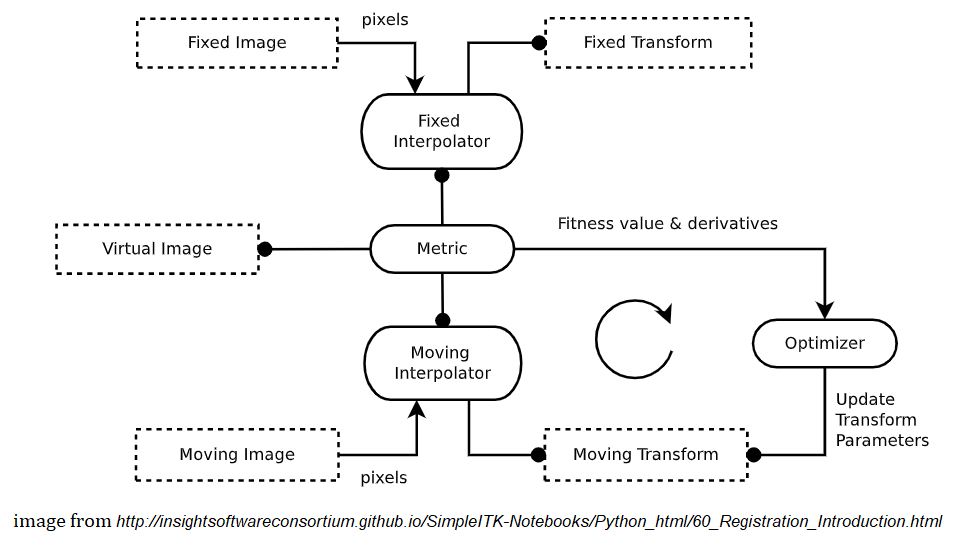

Registracija fotografije se vrši pomoću optimizacije u prostoru parametara (transformacija koja se primenjuje na pokretnu sliku radi poravnanja sa fiksnom slikom definiše se parametrima); ovi parametri se dorađuju pomoću algoritma za optimizaciju da bi se optimizirala metrika sličnosti izračunata između fotografija.

Klasa *ImageRegistrationMethod* pruža metod interfejsa modularnom okviru za registraciju *SimpleITK* (v4). Ova klasa obuhvata sve potrebne elemente potrebne za izvršavanje jednostavne registracije fotografije između dve fotografije.

Registracija će se izvršiti pomoću optimizacije; metoda *SetOptimizerAsGradientDescent()* primenjuje jednostavan optimizator spuštanja gradijentom. Na svakoj iteraciji trenutni parametar se ažurira prema sledećoj jednačini (gde je *f* ciljna funkcija za optimizaciju, a *pn* predstavlja vrednost parametra, *p*, u iteraciji *n*, sa parametrom koji se može pokrenuti malim slučajnim vrednost):

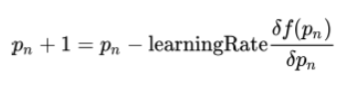

Parametri prosleđeni funkciji gradijentnog spuštanja su:
- *learningRate* (podrazumevano 1.0), 
- *numberOfIterations* (broj iteracija za pokretanje algoritma gradijentnog spuštanja), 
- *convergenceMinimumValue* (kada vrednost konvergencije dostigne ovu vrednost, algoritam se tretira kao konvergentan) i 
- *convergenceWindowSize*. 

Metoda *SetMetricAsMattesMutualInformation()* koristi se za registraciju dve fotografije sa međusobnim informacijama između njih.

In [11]:
!pip3 install SimpleITK

     |████████████████████████████████| 47.4MB 91kB/s 


(256, 256) (256, 256)


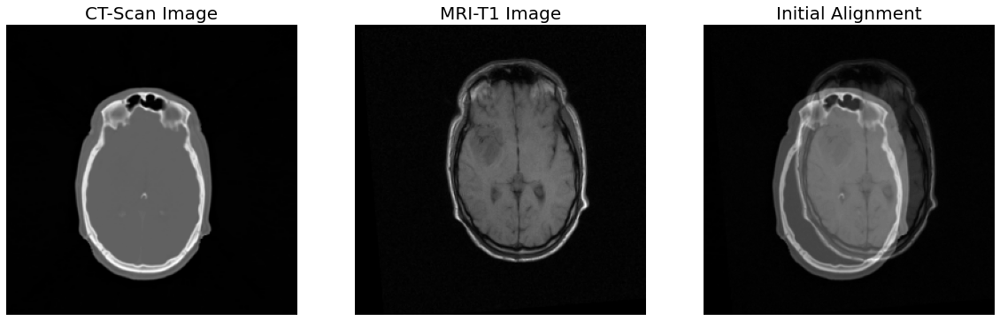

In [12]:
# https://stackoverflow.com/questions/41692063/what-is-the-difference-between-image-registration-and-image-alignment
# https://www.insight-journal.org/rire/download_training_data.php
# https://itk.org/Wiki/SimpleITK/Tutorials/MICCAI2015
%matplotlib inline
import SimpleITK as sitk
import numpy as np
import matplotlib.pyplot as plt

# Učitavanje fotografije koju treba poravnati
# CT skenirana fotografija kao fiksna (ciljna) fotografija i MRI-T1 fotografija kao pokretna (izvorna) fotografija
fixed_image =  sitk.ReadImage("images/ct_scan_11.jpg", sitk.sitkFloat32)
moving_image = sitk.ReadImage("images/mr_T1_06.jpg", sitk.sitkFloat32) 

# Konvertovanje SimpleITK Image objekata u NumPy nizove za prikazivanje fotografije pomoću matplotlib
fixed_image_array = sitk.GetArrayFromImage(fixed_image)
moving_image_array = sitk.GetArrayFromImage(moving_image)
print(fixed_image_array.shape, moving_image_array.shape)

plt.figure(figsize=(20,10))
plt.gray()
plt.subplot(131), plt.imshow(fixed_image_array), plt.axis('off'), plt.title('CT-Scan Image', size=20)
plt.subplot(132), plt.imshow(moving_image_array), plt.axis('off'), plt.title('MRI-T1 Image', size=20)
plt.subplot(133), plt.imshow(0.6*fixed_image_array + 0.4*moving_image_array), plt.axis('off'), plt.title('Initial Alignment', size=20)
plt.show()

In [13]:
np.random.seed(2)

# Kreiranje instance klase ImageRegistrationMethod,
# koja implementira podesivi okvir za registraciju sa više rezolucija u SimpleITK
registration_method = sitk.ImageRegistrationMethod()

# Poravnanje centara ulaznih fotografija
# Definisanje centra fiksne fotografije kao centra rotacije
initial_transform = sitk.CenteredTransformInitializer(fixed_image, moving_image, sitk.Similarity2DTransform())
   
# Podešavanje metrike sličnosti
registration_method.SetMetricAsMattesMutualInformation(numberOfHistogramBins=50)
registration_method.SetMetricSamplingStrategy(registration_method.RANDOM)
registration_method.SetMetricSamplingPercentage(0.01)
registration_method.SetInterpolator(sitk.sitkLinear)

# Podešavanja optimizatora (100 iteracija)
registration_method.SetOptimizerAsGradientDescent(learningRate=1.0, numberOfIterations=100, convergenceMinimumValue=1e-6, convergenceWindowSize=10)
registration_method.SetOptimizerScalesFromPhysicalShift()

# Podešavanje za multi-resolution framework      
registration_method.SetShrinkFactorsPerLevel(shrinkFactors = [4,2,1])
registration_method.SetSmoothingSigmasPerLevel(smoothingSigmas=[2,1,0])
registration_method.SmoothingSigmasAreSpecifiedInPhysicalUnitsOn()

# Primena početne transformacije
registration_method.SetInitialTransform(initial_transform, inPlace=False)

# Registracija sa podešavanjima iz prethodnih koraka kako bismo dobili procenjenu konačnu transformaciju
final_transform = registration_method.Execute(sitk.Cast(fixed_image, sitk.sitkFloat32), 
                                               sitk.Cast(moving_image, sitk.sitkFloat32))

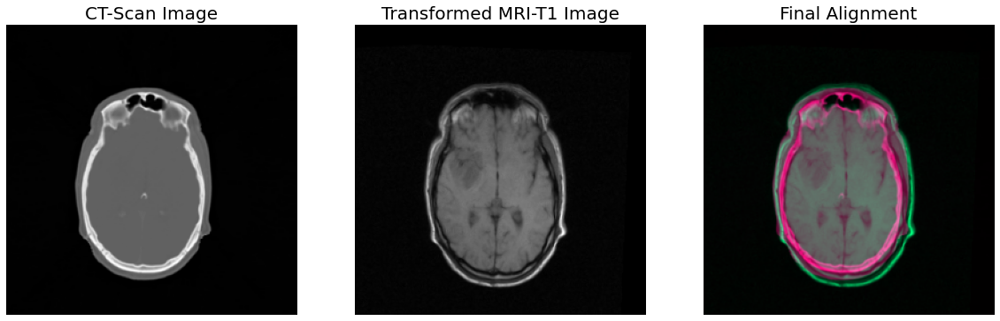

In [14]:
# Preuzimanje uzoraka pokretne (izvorne) fotografije u skladu sa konačnom transformacijom dobijenom u poslednjem koraku 
# da bismo dobili fotografiju poravnatu sa fiksnom (ciljnom) fotografijom
resampler = sitk.ResampleImageFilter()
resampler.SetReferenceImage(fixed_image);
resampler.SetInterpolator(sitk.sitkLinear)
resampler.SetDefaultPixelValue(100)
resampler.SetTransform(final_transform) 
out = resampler.Execute(moving_image)

# Kombinovanje ciljne fotografije sa transformisanom (poravnatom) izvornom fotografijom (da bismo vizuelizovali poravnanje)
simg1 = sitk.Cast(sitk.RescaleIntensity(fixed_image), sitk.sitkUInt8)
simg2 = sitk.Cast(sitk.RescaleIntensity(out), sitk.sitkUInt8)
cimg = sitk.Compose(simg1, simg2, simg1//2.+simg2//2.)

plt.figure(figsize=(20,10))
plt.gray()
plt.subplot(131), plt.imshow(fixed_image_array), plt.axis('off'), plt.title('CT-Scan Image', size=20)
plt.subplot(132), plt.imshow(sitk.GetArrayFromImage(out)), plt.axis('off'), plt.title('Transformed MRI-T1 Image', size=20)
plt.subplot(133), plt.imshow(sitk.GetArrayFromImage(cimg)), plt.axis('off'), plt.title('Final Alignment', size=20)
plt.show()

### Image Alignment with ECC algorithm // Poravnanje fotografije pomoću ECC algoritma


Problem parametarskog poravnanja fotografije uključuje pronalaženje transformacije koja poravnava dve fotografije. 

U ovom delu će biti prikazano kako proceniti geometrijsku transformaciju (u smislu matrice osnova) između dve fotografije koristeći ECC kriterijum sa implementacijom *OpenCV-python* biblioteke. 

S obzirom na par profila fotografije (intenziteti), *Ir(x)* (referentna fotografija) i *lw(y)* (iskrivljena fotografija) i skup koordinata *T = {xk, k = 1, .., K}* (poznato kao ciljno područje), problem poravnanja je pronalazak odgovarajuće postavljene koordinate na iskrivljenoj fotografiji.

Pod pretpostavkom da je φ dati model transformacije, problem poravnanja može se ekstrapolirati na problem procene parametara, *p*, kao što je prikazano:

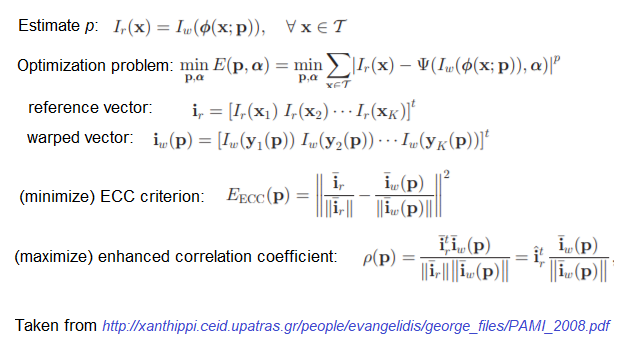

ρ(*p*) se maksimizira pomoću pristupa zasnovanih na gradijentu. ECC kriterijum ne zavisi od promena u kontrastu/osvetljenosti. Umesto toga, približavanje nelinearnoj ciljnoj funkciji je iterativno optimizovano kako bi proračunski učinio optimizator jednostavnim.

Koristićemo fotografiju u boji (RGB) čiji kanali u boji nisu pravilno poravnati (što rezultira nepravilnom vizuelizacijom fotografije u boji). Poravnaćemo kanale u boji pomoću ECC algoritma, a zatim ćemo prikazati obojenu fotografiju da bismo poboljšali njenu vizuelizaciju.

- Procenjeni Sobelovi horizontalni i vertikalni gradijenti korišćeni su u funkciji *get_gradient()* za izračunavanje gradijenta kanala boje. 

- Za ECC algoritam je korišćena funkcija *findTransformECC()* iz *OpenCV-Python*. 

Prva dva parametra koja je ova funkcija prihvatila bili su (jednokanalna) 
šablonska fotografija i ulazna fotografija. Kao šablon korišćen je kanal crvene boje, a kao ulazi kanali zelene/plave boje.

Treći parametar prosleđen funkciji je *warp_matrix*, koji je inicijalizovan u matricu identiteta 3x3.

Četvrti parametar je model kretanja; ovde je kao model kretanja korišćen *MOTION_HOMOGRAPHY* (8 parametara je procenjeno u matrici osnova 3x3).


---


Sledeća tabela navodi sve moguće modele kretanja u *OpenCV-Python* koji se mogu proslediti kao vrednost parametra:

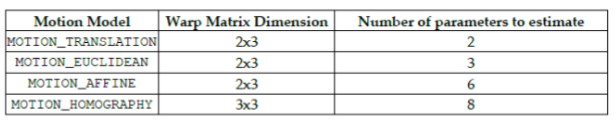

- Funkcija *findTransformECC()* koristi sličnosti u intenzitetu za sprovođenje poravnanja zasnovanog na površini. Ažurira početnu transformaciju, približno poravnavajući slike.

- Funkcija *warpPerspective()* korišćena je zajedno sa ulaznom zastavicom *cv2.WARP_INVERSE_MAP* i procenjenom matricom osnove za primenu inverznog iskrivljenja na ulaznoj fotografiji kako bi se ulazni kanali zelene/plave boje približili referentnom kanalu crvene boje.

4.1.2
992 610


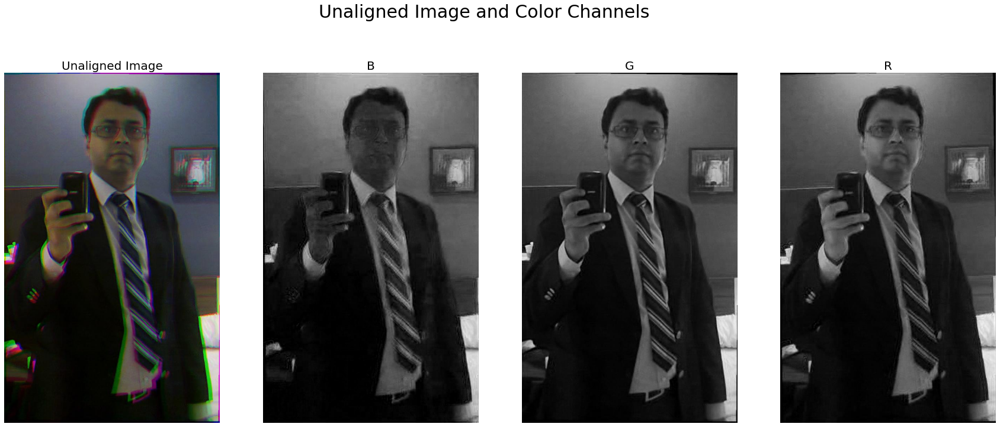

In [15]:
import cv2
print(cv2.__version__)
# 4.2.0
import numpy as np
import matplotlib.pylab as plt
 
"""
Budući da su kanali boja fotografije jače povezani u gradijentu
nego u domenu intenziteta pokrenućemo ECC algoritam u gradijentu
"""

def compute_gradient(im) :
    grad_x = cv2.Sobel(im,cv2.CV_32F,1,0,ksize=3)
    grad_y = cv2.Sobel(im,cv2.CV_32F,0,1,ksize=3)
    grad = cv2.addWeighted(np.absolute(grad_x), 0.5, np.absolute(grad_y), 0.5, 0)
    return grad

"""
Učitavanje ulazne RGB fotografije i 
iscrtavanje originalne fotografije i njenih neusklađenih kanala u boji
"""

im_unaligned =  cv2.imread("images/me_unaligned.png")

height, width = im_unaligned.shape[:2]
print(height, width)

channels = ['B', 'G', 'R']

plt.figure(figsize=(30,12))
plt.gray()
plt.subplot(1,4,1), plt.imshow(cv2.cvtColor(im_unaligned, cv2.COLOR_BGR2RGB)), plt.axis('off'), plt.title('Unaligned Image', size=20)
for i in range(3):
    plt.subplot(1,4,i+2), plt.imshow(im_unaligned[...,i]), plt.axis('off'), plt.title(channels[i], size=20)
plt.suptitle('Unaligned Image and Color Channels', size=30)
plt.show()


Processing Channel B...
[[ 9.9847031e-01 -7.3378873e-03  8.7377043e+00]
 [ 1.3389946e-02  9.9928313e-01 -3.7657268e+00]
 [-3.6525764e-06  2.5165843e-06  1.0000000e+00]]
Processing Channel G...
[[ 1.0092514e+00 -2.7040467e-02  8.6985922e+00]
 [ 2.6736347e-02  9.8989987e-01 -5.0035691e+00]
 [-6.7394632e-07  5.9876720e-07  1.0000000e+00]]


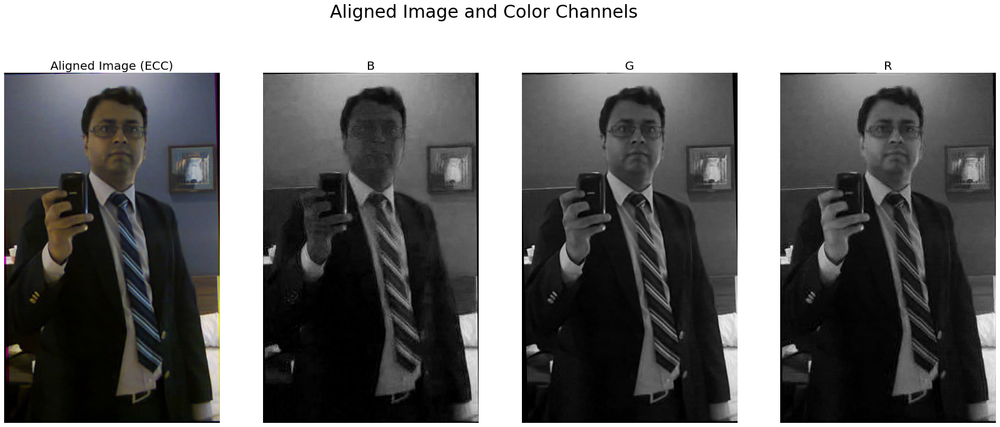

True

In [16]:
# Inicijalizovanje izlazne fotografije kopijom ulazne fotografije
im_aligned = im_unaligned.copy() 

# Definisanje modela kretanja koji se procenjuje
warp_mode = cv2.MOTION_HOMOGRAPHY

# Podešavanje matrice osnove na identitete
warp_matrix = np.eye(3, 3, dtype=np.float32) if warp_mode == cv2.MOTION_HOMOGRAPHY else np.eye(2, 3, dtype=np.float32)

# Definisanje kriterijuma prekida za algoritam
criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 500,  1e-6)

"""
Plavi i zeleni kanali biće poravnati sa crvenim kanalom, 
pa prvo izračunajte gradijent crvenog kanala
[B - 0, G - 1, R - 2]
"""
im_grad2 = compute_gradient(im_unaligned[...,2])

# Procena osnove matrice za prva dva kanala (plavi i zeleni) na crveni (treći) kanal pomoću funkcije findTransformECC()
for i in range(2) :
    print('Processing Channel {}...'.format(channels[i]))
    (cc, warp_matrix) = cv2.findTransformECC (im_grad2, compute_gradient(im_unaligned[...,i]),warp_matrix, warp_mode, criteria, None, 5)

    if warp_mode == cv2.MOTION_HOMOGRAPHY :
        # Poravnanje zelenog i plavog kanala sa crvenim kanalom
        # Perspective warp - transformation is a Homography
        im_aligned[...,i] = cv2.warpPerspective (im_unaligned[...,i], warp_matrix, (width,height), flags=cv2.INTER_LINEAR + cv2.WARP_INVERSE_MAP)
    else :
        # Affine warp - transformation is not a Homography
        im_aligned[...,i] = cv2.warpAffine(im_unaligned[...,i], warp_matrix, (width, height), flags=cv2.INTER_LINEAR + cv2.WARP_INVERSE_MAP);
    print (warp_matrix)
    
channels = ['B', 'G', 'R']
plt.figure(figsize=(30,12))
plt.subplot(1,4,1), plt.imshow(cv2.cvtColor(im_aligned, cv2.COLOR_BGR2RGB)), plt.axis('off'), plt.title('Aligned Image (ECC)', size=20)
for i in range(3):
    plt.subplot(1,4,i+2), plt.imshow(im_aligned[...,i]), plt.axis('off'), plt.title(channels[i], size=20)
plt.suptitle('Aligned Image and Color Channels', size=30)
plt.show()

cv2.imwrite("images/me_aligned.png", im_aligned)

### Face Alignment // Poravnanje lica

Poravnanje lica može se smatrati zadatkom obrade fotografije koji se sastoji od sledećih koraka:
1. Utvrdite orijentire lica (ili geometrijsku strukturu lica).
2. Izračunajte kanonsko poravnanje procenom geometrijske transformacije (na primer, afine transformacije) lica koje treba poravnati pomoću orijentira.

Poravnanje lica je proces normalizacije podataka - osnovni korak pre-obrade za mnoge algoritme prepoznavanja lica. Prvo ćemo koristiti detektor lica *dlib* biblioteke za otkrivanje lica sa fotografije koja sadrži lica, a zatim ćemo pomoću prediktora oblika izvući orijentire lica sa otkrivenih lica. Nakon toga, prevući ćemo ulazno lice (koristeći procenjenu transformaciju) na izlazno lice koristeći izdvojene orijentire lica.

Ključni atributi lica (na primer, uglovi usta, levo/desno oko/obrva, vrh nosa, vilica i tako dalje) identifikuju se i obeležavaju orijentirima lica. Detektor lica biblioteke *dlib* koristi unapred obučenu grupu regresionih stabala za direktnu oznaku orijentira iz intenziteta piksela ulazne fotografije lica (bez izdvajanja karakteristika), sa velikom preciznošću. Dalje, koristićemo klasu *FaceAligner* iz biblioteke *imutil* za poravnavanje lica prvo procenom, a zatim primenom afine transformacije između orijentira izvučenih sa lica kandidata za poravnanje.

- Za otkrivanje lica korišćena je funkcija *get_frontal_face_detector()* (histogram orijentisanih gradijenata (HOG)) iz biblioteke *dlib*.

- Funkcija *shape_predictor()* iz *dlib*-a pozvana je serijskim unapred obučenim detektorom orijentira na licu (datoteka podataka) za procenu (x, y) koordinata 68 ključnih tačaka koje se mapiraju na orijentire lica (strukture) iz datog otkrivenog lice (prediktor oblika *dlib* interno primenjuje Kazemi i Sullivan-ov algoritam, koji koristi ansambl regresionih stabala za procenu orijentira lica direktno iz ulaznih piksela lica bez ikakvog izdvajanja karakteristika). Orijentiri izvučeni sa lica izgledaju kao što je prikazano:


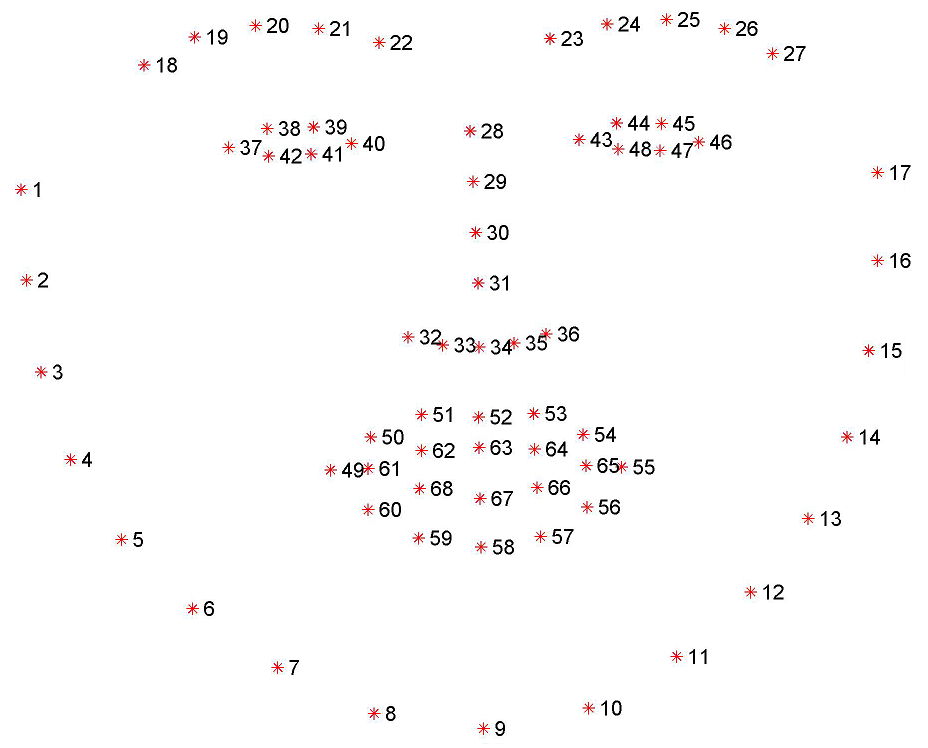

- Objekat klase *FaceAligner* iz biblioteke *imutils* je instanciran sa objektom *shape_predictor* kao ulaznim parametrom (jer je potreban za pristup izvađenim orijentirima lica). Njegova metoda *align()* korišćena je za poravnanje datog otkrivenog lica.

- Metoda *align()* vrši sledeće operacije na orijentirima lica kako bi poravnala dato lice. Izračunava se ugao rotacije između očiju, što omogućava ispravljanje rotacije. Zatim izračunava razmere nove izlazne fotografije.

- Funkcija *warpAffine()* iz *OpenCV-Python* biblioteke koristi zajedno sa izračunatom matricom rotacije i željenom izlaznom veličinom kao parametre funkcije za dobijanje poravnate izlazne slike.

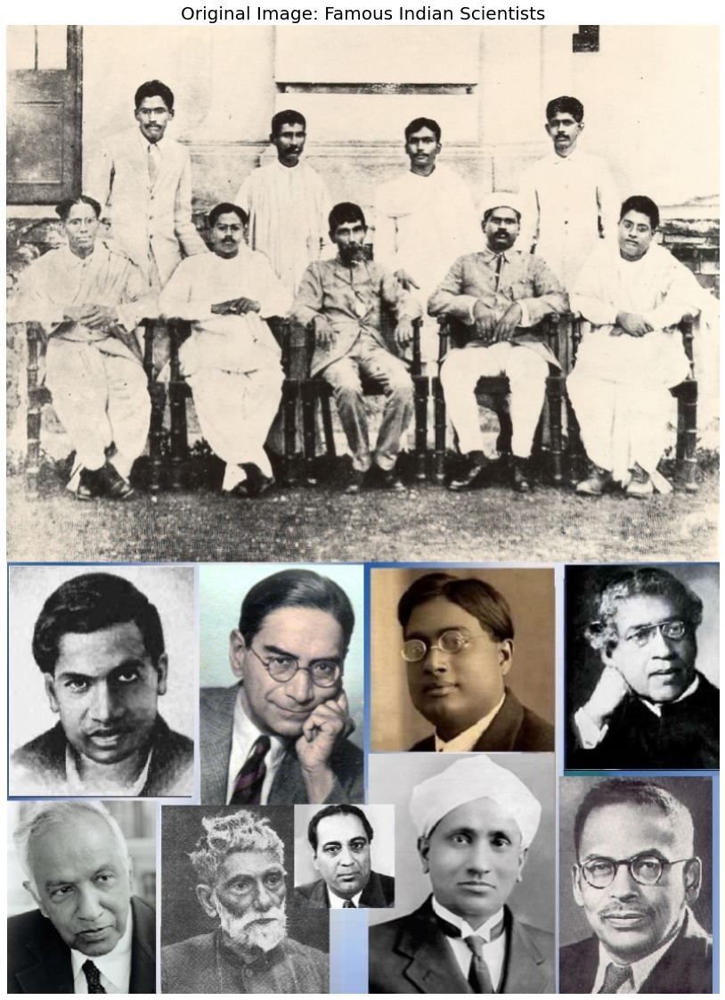

Number of faces detected: 17


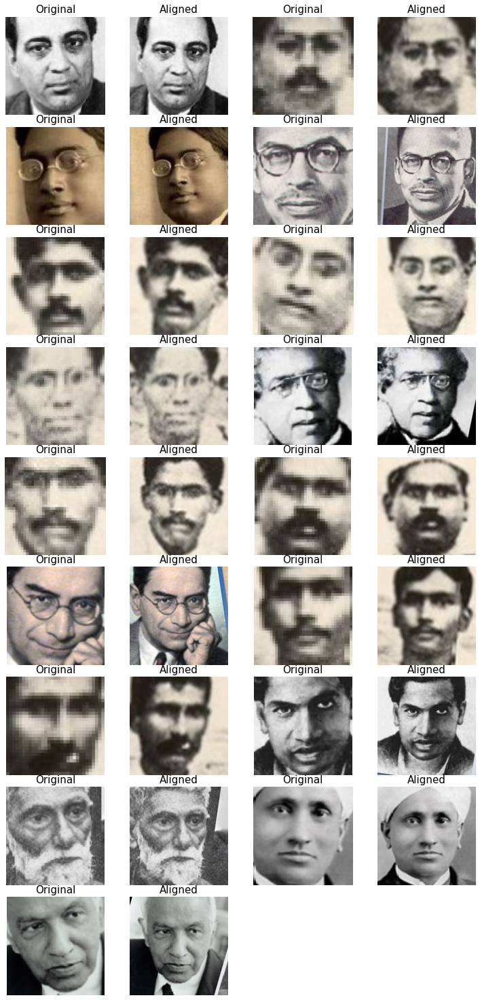

In [17]:
from imutils.face_utils import FaceAligner
from imutils.face_utils import rect_to_bb
import imutils
import dlib
import cv2
import matplotlib.pylab as plt

# Inicijalizacija detektora lica iz dlib-a 
# Učitavanje unapred obučenog modela kao prediktora orijentacije lica 
# Kreiranje instance FaceAligner objekta iz imutils
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor('models/shape_predictor_68_face_landmarks.dat')
face_aligner = FaceAligner(predictor, desiredFaceWidth=256) 

# Učitavanje ulazne fotografije, promena veličine i konvertovanje u grayscale
image = cv2.imread('images/scientists.png')
image = imutils.resize(image, width=800)
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
 
# Prikaz originalne ulazne fotografije i detekcija lica na grayscale fotografiji
plt.figure(figsize=(20,20))
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)), plt.axis('off')
plt.title('Original Image: Famous Indian Scientists', size=20)
plt.show()
rects = detector(gray, 2)
print('Number of faces detected:', len(rects)) # 17


# Petlja preko detektovanih lica
"""
za svako od lica izvucite ROI, 
koristite orijentire na licu da biste procenili afiničnu transformaciju radi poravnanja 
i primenite transformaciju da poravnate lice
"""
i = 1
plt.figure(figsize=(10,20))
plt.subplots_adjust(0,0,1,1,0.05,0.12)
for rect in rects:
    (x, y, w, h) = rect_to_bb(rect)
    face_original = imutils.resize(image[y:y + h, x:x + w], width=256)
    face_aligned = face_aligner.align(image, gray, rect)

    # Prikaz izlazne fotografije
    plt.subplot(9,4,i), plt.imshow(cv2.cvtColor(face_original, cv2.COLOR_BGR2RGB)), plt.title("Original", size=15), plt.axis('off')
    plt.subplot(9,4,i+1), plt.imshow(cv2.cvtColor(face_aligned, cv2.COLOR_BGR2RGB)), plt.title("Aligned", size=15), plt.axis('off')
    i += 2
plt.show()

### Robust Matching with RANSAC Algorithm using Harris Corner Brief Descriptors // Robusno podudaranje sa RANSAC algoritmom pomoću Harris Corner Brief deskriptora 


*Random Sample Consensus* (RANSAC) je iterativni nedeterministički algoritam za robusnu procenu parametara matematičkog modela iz nekoliko slučajnih podskupova unutrašnjih podataka iz kompletnog skupa podataka (koji sadrže odstupanja). Koristićemo implementaciju modula *skimage.measure* algoritma RANSAC. 

Svaka iteracija RANSAC algoritma čini sledeće:

1. Bira slučajni uzorak veličine *min_samples* iz originalnih podataka i osigurava da je uzorak podataka validan za uklapanje u model.

2. Odgovara modelu (odnosno proceni parametre modela) uzorkovanom skupu podataka i osigurava da je procenjeni model valjan.

3. Proverava da li procenjeni model odgovara svim ostalim tačkama podataka. Izračunava skup konsenzusa (*inliers*) i *outliers* iz svih tačaka podataka računanjem neke funkcije gubitka specifične za model (na primer, reziduale) u procenjeni model. *Inliers* su definisani kao tačke podataka koje imaju manje ostatke od navedenog preostalog praga.

4. Sprema model (definisan procenjenim parametrima modela) kao najbolji model (do sada viđen) ako je broj uzoraka u skupu konsenzusa (*inliers*) maksimalan. Ako postoji jednak broj (u smislu broja unutrašnjih elemenata), model koji ima manje ostataka smatra se najboljim modelom.

Navedeni koraci se izvršavaju ili maksimalni broj puta (definisano sa *max_trials*) ili dok se ne ispuni jedan od kriterijuma zaustavljanja (naveden pomoću *stop_sample_num, stop_probability*,...). 

Konačni model se dobija korišćenjem svih unutrašnjih uzoraka koji odgovaraju najboljem do sada pronađenom modelu. Broj potrebnih uzoraka (ili izabranih slučajnih uzoraka) *N*, tako da, sa verovatnoćom *p*, bar jedan slučajni uzorak nema izuzetke, dat je izrazom prikazanim na sledećem dijagramu (tipična vrednost *p* koju želimo da imamo je 0,99 ili više):


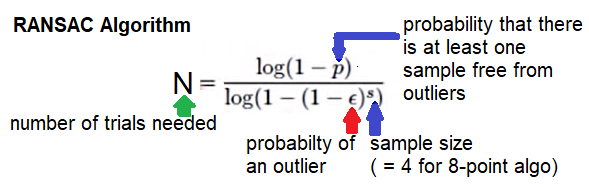

- Funkcije *corner_harris()* i *corner_peaks()* iz *skimage.feature* modula koriste se za dobijanje tačaka iz ulaznih fotografija (pronalazi tačke sa velikom funkcijom odziva ugla R, biranjem lokalnih maksimuma u R).

- Funkcija *extract()* koristi se za izračunavanje binarnih deskriptora koji odgovaraju ključnim tačkama za obe fotografije.

- Funkcija *match_descriptors()* koristi se za podudaranje odgovarajućih ključnih tačaka, a podudarne ključne tačke se samo vraćaju.

- Funkcija *ransac()* koristi se za uklapanje homografskog modela za transformaciju sa RANSAC algoritmom. Parametri funkcije su:
1. izvorna/odredišna fotografija
2. klasa modela (ProjectiveTransform)
3. broj min. uzoraka (postavljen na 4 jer je minimalni broj tačaka za procenu homografije 8, koristeći algoritam od 8 tačaka)
4. *residual_threshold* (maksimalna udaljenost za tačku podataka koja se klasifikuje kao inlier)
5. *max_trials* (maksimalan broj iteracija za algoritam)

- Funkcija *warp()* koristi se za primenu projektivne transformacije na odredišnoj fotografiji (sa objektom homografije kao argumentom *inverse_map* na funkciju, za upotrebu inverzne homografske matrice procenjene sa/bez RANSAC-a).

39
6


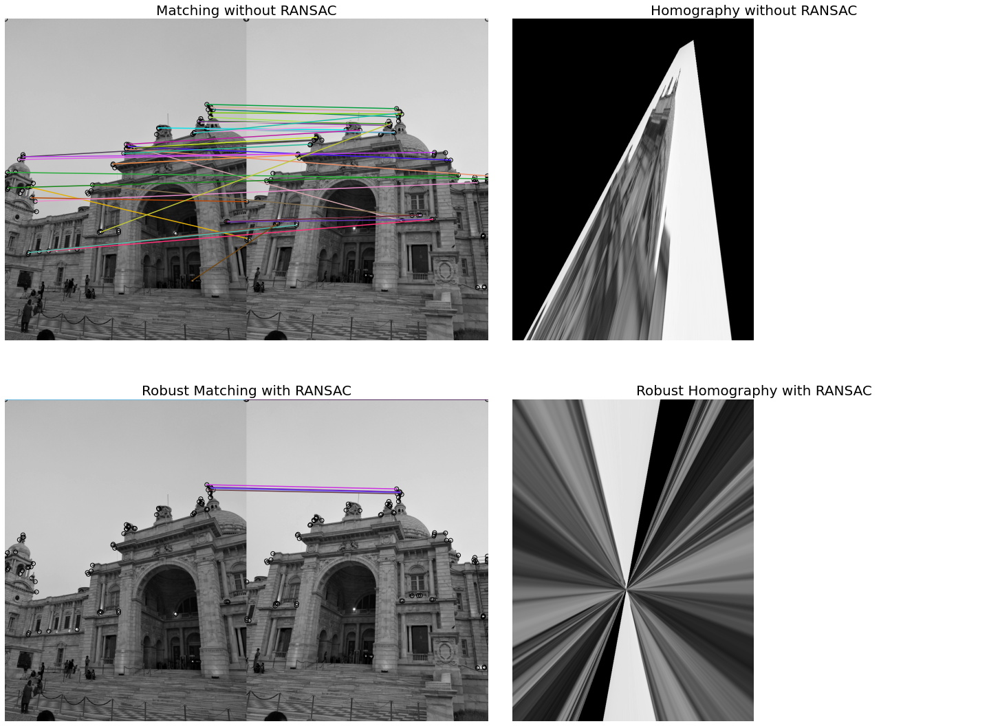

In [18]:
from skimage.feature import (corner_harris, corner_peaks, BRIEF, match_descriptors, plot_matches)
from skimage.transform import ProjectiveTransform, warp
from skimage.measure import ransac
from skimage.io import imread
from skimage.color import rgb2gray
import matplotlib.pylab as plt

# Definisanje nasumičnog semena pomoću numpy (radi ponovljivih rezultata)
np.random.seed(2)

# Učitavanje ulaznih fotografija koje se podudaraju
img1 = rgb2gray(imread('images/victoria3.png'))
img2 = rgb2gray(imread('images/victoria4.png'))

# Izdvajanje Harris Corner tačaka (karakteristika) iz ulaznih fotografija
keypoints1 = corner_peaks(corner_harris(img1), min_distance=1)
keypoints2 = corner_peaks(corner_harris(img2), min_distance=1)

# Izdvajanje binarnih BRIEF deskriptora za ključne tačke pronađene za obe ulazne fotografije
extractor = BRIEF(patch_size=10)
extractor.extract(img1, keypoints1)
descriptors1 = extractor.descriptors
extractor.extract(img2, keypoints2)
descriptors2 = extractor.descriptors

# Podudaranje deskriptora sa dve fotografije i odabir ključnih tačaka sa fotografija koje se samo podudaraju
matches = match_descriptors(descriptors1, descriptors2)
src_keypoints = keypoints1[matches[:,0]]
dst_keypoints = keypoints2[matches[:,1]]

# Računanje homografske matrice dve fotografije 
# korišćenjem svih podudarnih ključnih tačaka iz izvorne i odredišne fotografije
homography = ProjectiveTransform()
homography.estimate(src_keypoints, dst_keypoints)
print(len(matches)) # 39

# Upotreba RANSAC algoritma za računanje robusnog podudaranja sa najvećim brojem unutrašnjih slojeva koristeći klasu ProjectiveTransform
homography_robust, inliers = ransac((src_keypoints, dst_keypoints), ProjectiveTransform, min_samples=4,
                               residual_threshold=2, max_trials=500)
outliers = inliers == False


robust_matches = match_descriptors(descriptors1[matches[:,0]][inliers], descriptors2[matches[:,1]][inliers])
print(len(robust_matches)) # 6

"""
Kreiranje izlazne fotografije koristeći objekte ProjectiveTransform 
dobijene sa / bez RANSAC-a i njihovo iscrtavanje
"""
fig, ax = plt.subplots(nrows=2, ncols=2, sharex=True, sharey=True, figsize=(20,15))
plt.gray()
plt.subplots_adjust(0,0,1,1,0.05,0.05)
plot_matches(ax[0,0], img1, img2, keypoints1, keypoints2, matches), ax[0,0].set_title('Matching without RANSAC', size=20)
ax[0,1].imshow(warp(img2, homography, output_shape=img2.shape)), ax[0,1].set_title('Homography without RANSAC', size=20)
plot_matches(ax[1,0], img1, img2, keypoints1, keypoints2, robust_matches), ax[1,0].set_title('Robust Matching with RANSAC', size=20)
ax[1,1].imshow(warp(img2, homography_robust, output_shape=img2.shape)), ax[1,1].set_title('Robust Homography with RANSAC', size=20)
for a in np.ravel(ax):
    a.axis('off')
plt.show()

### Image Mosaicing (Cylindrical Panorama) // Mozaikovanje fotografija (cilindrična panorama)


Mozaikovanje fotografija odnosi se na zadatak obrade fotografije kombinovanjem više preklapajućih fotografija kako bi se stvorila (segmentirana) panoramska fotografija (alternativno nazvana mozaik fotografije). Tri glavne komponente mozaikovanja:
- Registracija fotografije (tako da se njene karakteristike poravnaju)
- Utvrditi preklapanje
- Mešanje



Funkcija *stitch()* klase *Stitcher* iz *opencv-python* se koristi za stvaranje mozaika fotografije. Ima svoj tok, kao što je prikazano:

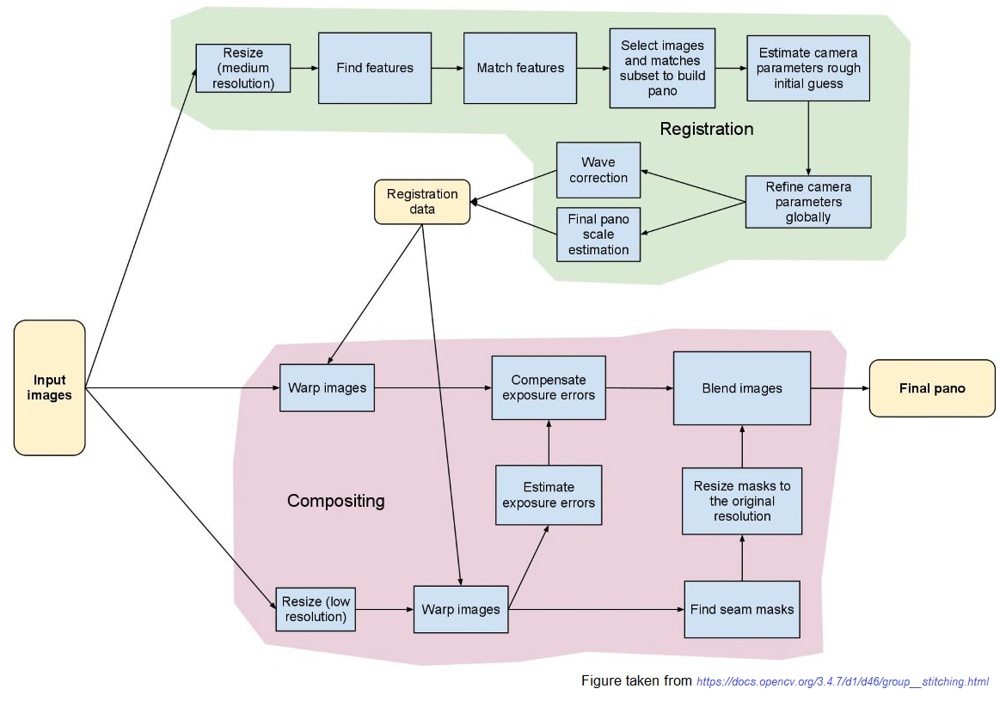

In [ ]:
!pip install opencv-contrib-python==3.4.2.17

In [ ]:
!pip install opencv-python==3.4.2.17

4.1.2
Loading images...
Number of images to stitch: 7


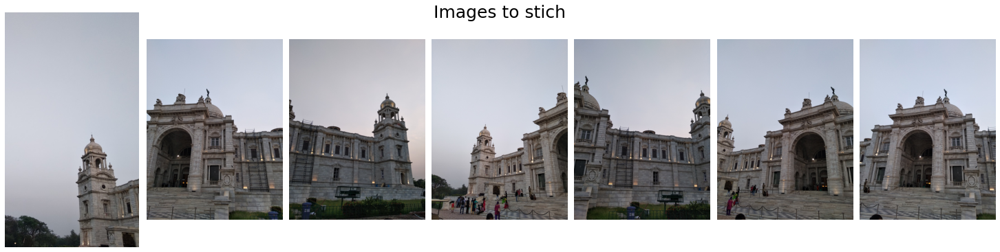

Stitching images...
0


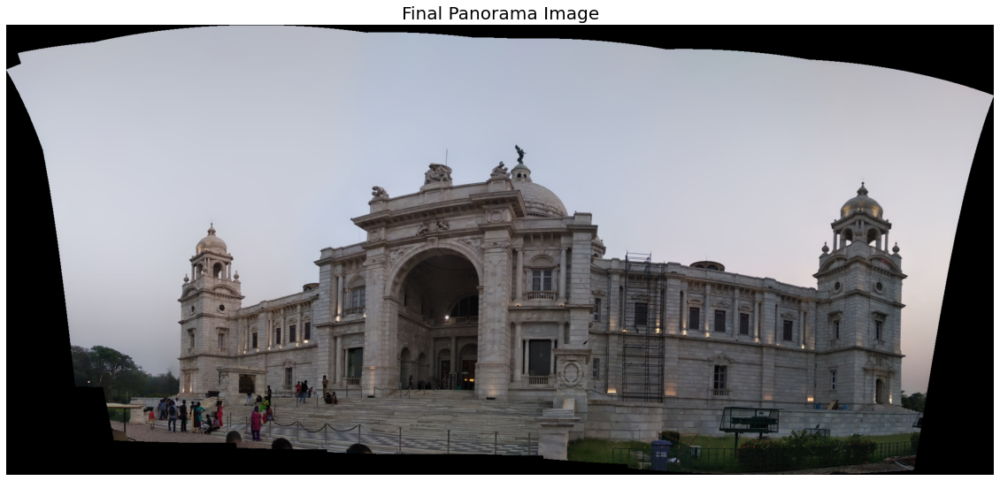

In [19]:
import numpy as np
import cv2
import glob
import matplotlib.pylab as plt

print(cv2.__version__)
# 3.4.2

# Inicijalizacija listu fotografija koje treba spojiti
print("Loading images...")
images = [ cv2.cvtColor(cv2.imread(img), cv2.COLOR_BGR2RGB) for img in glob.glob('images/victoria*.png')]
print('Number of images to stitch: {}'.format(len(images)))

# Prikaz fotografija
fig = plt.figure(figsize=(20, 5))
for i in range(len(images)):
    plt.subplot(1,len(images),i+1)
    plt.imshow(images[i])
    plt.axis('off')
fig.subplots_adjust(left=0, right=1, bottom=0, top=0.95, hspace=0.05, wspace=0.05) 
plt.suptitle('Images to stich', size=25)
plt.show()

# Inicijalizacija OpenCV Stitcher objekta i upotreba stitch() metode za generisanje mozaika
print("Stitching images...")
# stitcher = cv2.createStitcher()
stitcher = cv2.Stitcher.create()
(status, stitched) = stitcher.stitch(images)
print(status)

# Prikaza panorame
plt.figure(figsize=(20,10))
plt.imshow(stitched), plt.axis('off'), plt.title('Final Panorama Image', size=20)
plt.show()

### Face Morphing // Preoblikovanje lica

Cilj preoblikovanja fotografije lica je pronaći prosek dva objekta/lica na fotografijama. To nisu u proseku dve fotografije predmeta (lica); nego je to fotografija prosečnog predmeta (lica). 

Ponovo možemo da pribegnemo (lokalnom) podudaranju karakteristika. Na primer, za morfiranje lica može se izvršiti podudaranje između ključnih tačaka kao što su nos u nos, oko u oko itd. - ovo je lokalno (neparametarsko) iskrivljenje.

Koraci implementacije preoblikovanja lica pomoću *mesh-warping* algoritma (algortima za iskrivljenje mreže):

1. Definisanje korespondencija: Algoritam za preoblikovanja lica transformiše izvorno lice u ciljno lice koristeći skup tačaka obeležja zajedničkih za oba lica, ili ručno kreiranih ili koristeći orijentire lica automatski generisane pomoću detekcije crta lica za svako lice. Morate da pronađete tačne korespondencije između lica koja treba poravnati (na primer, dosledno obeležavanje tačaka obeležja isti redosled tačaka u dva lica).

2. Delaunaiova triangulacija: Treba da obezbedite triangulaciju tačaka koje će se koristiti za morfiranje. Delaunaijeva triangulacija ne daje vrlo mršave trouglove, stoga se ovaj algoritam obično koristi. Izračunajte Delaunai-jevu triangulaciju na bilo kom skupu tačaka (ne na obe) i triangulacija mora biti ista tokom morfiranja.

3. Izračunavanje srednjeg (preobraženog) lica: Pre izračunavanja celokupnog niza preobražaja, izračunajte središnje lice izvornih i odredišnih fotografija. To uključuje izračunavanje prosečnog oblika (odnosno proseka svake lokacije ključne tačke na dve strane): izračunajte lokaciju tačaka obeležja na preobraženoj fotografiji, M. Za svaki trougao na izvornoj fotografiji izračunajte afine transformacije koji preslikava tri ugla trougla u odgovarajuće tačke ugla trougla na preobraženoj fotografiji, a zatim transformiše sve piksele unutar trougla u preobraženu fotografiju pomoću upravo izračunate afine transformacije. Konačno, stavite ove dve fotografije u alfablon i ovo je vaša poslednja promenjena fotografija.

Da bi se izvorna fotografija pretvorila u odredišnu fotografiju, prvo treba uspostaviti korespondenciju piksela između dve fotografije. Za svaki piksel na izvornoj fotografiji treba pronaći odgovarajući piksel odredišne fotografije. Kada se pronađu ove korespondencije, fotografije se mogu mešati u dva koraka:

1. Izračunajte lokaciju piksela na preoblikovanoj slici (izračunato je pomoću funkcije *weighted_average_points()*)

2. Izračunajte intenzitet piksela na toj lokaciji na preobraženoj slici (izračunat je pomoću funkcije *weighted_average()*)


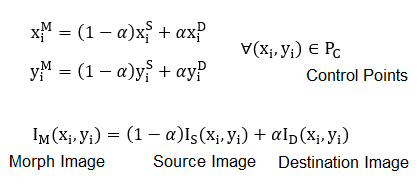

- Funkcija *bilinear_interpolate()* prihvata nekoliko ulaznih parametara, od kojih je prvi ulazna fotografija (pretpostavlja se da je maksimalan broj kanala na fotografiji tri), a drugi su ulazne koordinate (np niz sa dva reda; prvi i drugi red predstavljaju x i y koordinate ulazne tačke, respektivno).

- Funkcija *gen_triangular_affine_matrices()* je funkcija Python generatora koja prihvata tri ulazna parametra:
1. *NumPy* niz tripletnih indeksa koji odgovaraju uglovima trougla
2. *NumPy* niz od (x, y) tačaka koje odgovaraju orijentirima lica za izvornu fotografiju
2. *NumPy* niz od (x, y) tačaka koje odgovaraju orijentirima za odredišnu fotografiju

here 68 68


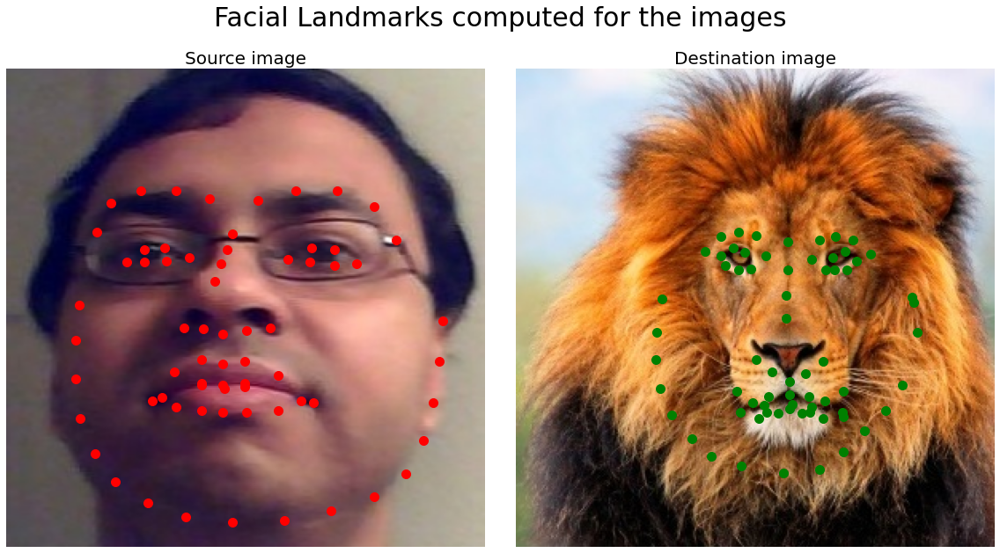

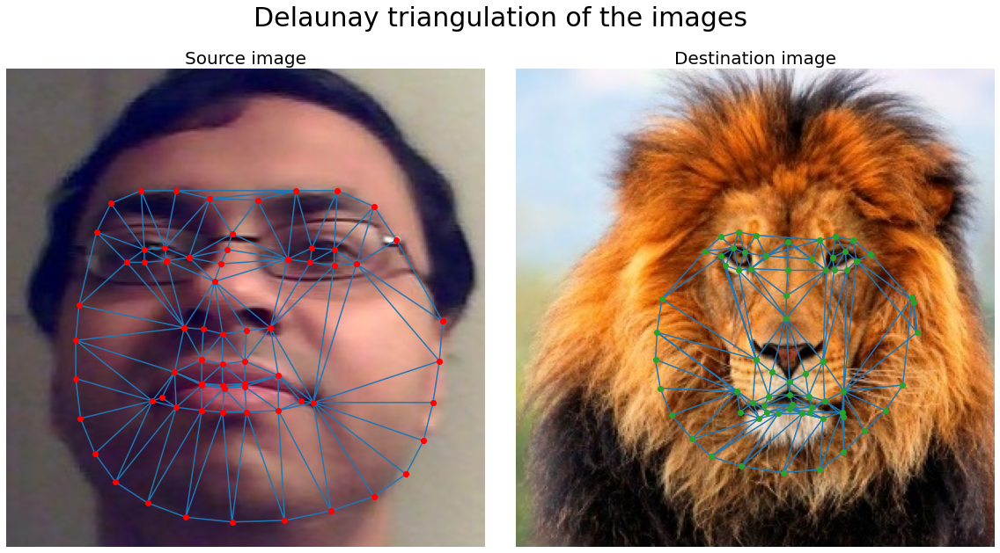

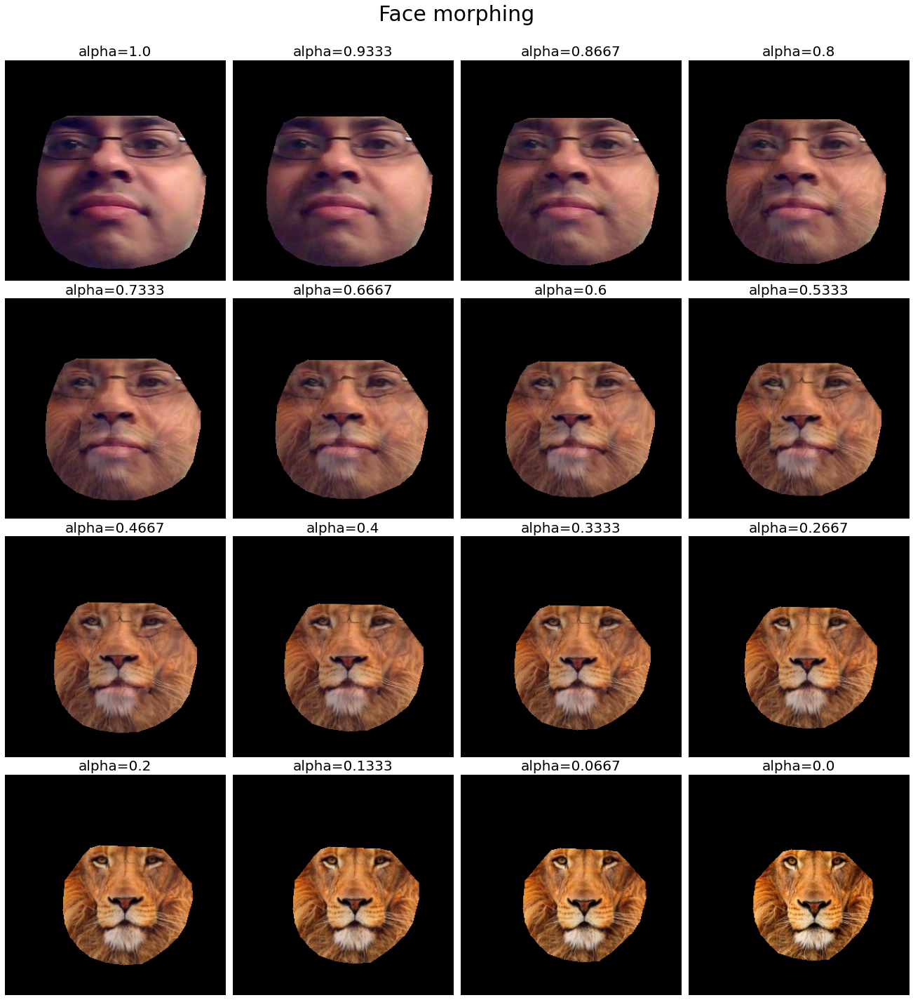

In [20]:
from scipy.spatial import Delaunay
from scipy import interpolate
from skimage.io import imread
import scipy.misc
import cv2
import dlib
import numpy as np
from matplotlib import pyplot as plt

"""
Prvo koristite detektor lica dlib biblioteke i prediktor oblika da biste automatski izračunali orijentire lica sa ljudskog lica 
Potrebna je ulazna fotografija, logička zastavica koja označava da li treba dodati granične tačke ili ne, i putanja modela dlib biblioteke shape_predictor
"""
def get_face_landmarks(image, predictor_path = 'models/shape_predictor_68_face_landmarks.dat'):
  detector = dlib.get_frontal_face_detector()
  predictor = dlib.shape_predictor(predictor_path)
  try:    
    # Izračunavanje 68 orijentira na licu (ključne tačke) upotrebom dlib za svako otkriveno lice (u ovom slučaju biće samo jedno lice) koristeći objekat za predviđanje oblika za fotografiju ljudskog lica
    dets = detector(image, 1)
    points = np.zeros((68, 2))
    for k, d in enumerate(dets):
        # Dobijanje orijentira za lice u polju d
        shape = predictor(image, d)
        for i in range(68):
            points[i, 0] = shape.part(i).x
            points[i, 1] = shape.part(i).y
  except Exception as e:
    print('Failed finding face points: ', e)
    return []
  points = points.astype(np.int32)
  return points

# Odgovarajući orijentiri na licu lava ručno su definisani u txt fajlu
# Iščitavanje tih orijentira
def read_lion_landmarks():    
    with open("models/lion_face_landmark.txt") as key_file:
        keypoints = [list(map(int, line.split())) for line in key_file]
        return(np.array(keypoints))

# Izračunavanje alfa mešanja dva skupa tačaka (piksela) i dve fotografije koristeći sledeće 2 funkcije
def weighted_average_points(start_points, end_points, percent=0.5):
  # Težinski prosek dva seta tačaka
  if percent <= 0:   return end_points
  elif percent >= 1: return start_points
  else: return np.asarray(start_points*percent + end_points*(1-percent), np.int32)

def weighted_average(img1, img2, percent=0.5):
  if percent <= 0: return img2
  elif percent >= 1: return img1
  else: return cv2.addWeighted(img1, percent, img2, 1-percent, 0)

# Interpolacija preko svakog kanala fotografije
def bilinear_interpolate(img, coords):
  int_coords = coords.astype(np.int32)
  x0, y0 = int_coords
  dx, dy = coords - int_coords
  # 4 neighour pixels
  q11, q21, q12, q22 = img[y0, x0], img[y0, x0+1], img[y0+1, x0], img[y0+1, x0+1]
  btm = q21.T * dx + q11.T * (1 - dx)
  top = q22.T * dx + q12.T * (1 - dx)
  interpolated_pixels = top * dy + btm * (1 - dy)
  return interpolated_pixels.T

# Generisanje koordinata mreže x,y unutar ROI tačaka
def get_grid_coordinates(points):
  xmin, xmax = np.min(points[:, 0]), np.max(points[:, 0]) + 1
  ymin, ymax = np.min(points[:, 1]), np.max(points[:, 1]) + 1
  return np.asarray([(x, y) for y in range(ymin, ymax) for x in range(xmin, xmax)], np.uint32)

# Iskrivljenje svakog trougla iz izvorne fotografije samo unutar ROI odredišne fotografije
def process_warp(src_img, result_img, tri_affines, dst_points, delaunay):
  roi_coords = get_grid_coordinates(dst_points)
  # Indeksi koordinata; -1 ako piksel nije ni u jednom trouglu
  roi_tri_indices = delaunay.find_simplex(roi_coords)
  for simplex_index in range(len(delaunay.simplices)):
    coords = roi_coords[roi_tri_indices == simplex_index]
    num_coords = len(coords)
    out_coords = np.dot(tri_affines[simplex_index], np.vstack((coords.T, np.ones(num_coords))))
    x, y = coords.T
    result_img[y, x] = bilinear_interpolate(src_img, out_coords)

# Izračunavanje matrice afine transformacije za svaki vrh trougla (x,y) (od dest_points do src_points)
def gen_triangular_affine_matrices(vertices, src_points, dest_points):
  ones = [1, 1, 1]
  for tri_indices in vertices:
    src_tri = np.vstack((src_points[tri_indices, :].T, ones))
    dst_tri = np.vstack((dest_points[tri_indices, :].T, ones))
    mat = np.dot(src_tri, np.linalg.inv(dst_tri))[:2, :]
    yield mat

# Uzimanje izvornih/odredišnih fotografija i odgovarajuće kontrolne tačke i upotreba definisane funkcije za izračunavanje preobražene izlazne fotografije i odgovarajuće Delaunai-jeve triangulacije kontrolnih tačaka (orijentiri na licu)
def warp_image(src_img, src_points, dest_points, dest_shape):
  num_chans = 3
  src_img = src_img[:, :, :3]
  rows, cols = dest_shape[:2]
  result_img = np.zeros((rows, cols, num_chans), np.uint8)
  delaunay = Delaunay(dest_points)
  tri_affines = np.asarray(list(gen_triangular_affine_matrices(delaunay.simplices, src_points, dest_points)))
  process_warp(src_img, result_img, tri_affines, dest_points, delaunay)
  return result_img, delaunay

# Učitavanje fotografija
src_path = 'images/me.png'
dst_path = 'images/lion.png' 
src_img = imread(src_path)
dst_img = imread(dst_path)
size = dst_img.shape[:2]
src_img = cv2.resize(src_img[...,:3], size)

# Definisanje kontrolnih tačaka
src_points = get_face_landmarks(src_img)
dst_points = read_lion_landmarks()

points = weighted_average_points(src_points, dst_points, percent=50)
src_face, src_delaunay = warp_image(src_img, src_points, points, size)
end_face, end_delaunay = warp_image(dst_img, dst_points, points, size)

print('here', len(src_points), len(dst_points))
  
fig = plt.figure(figsize=(20,10))
plt.subplot(121), plt.imshow(src_img)
for i in range(len(src_points)):
    plt.plot(src_points[i,0], src_points[i,1], 'r.', markersize=20)
plt.title('Source image', size=20), plt.axis('off')
plt.subplot(122), plt.imshow(dst_img)
for i in range(len(dst_points)):
    plt.plot(dst_points[i,0], dst_points[i,1], 'g.', markersize=20)
plt.title('Destination image', size=20), plt.axis('off')
plt.suptitle('Facial Landmarks computed for the images', size=30)
fig.subplots_adjust(wspace=0.01, left=0.1, right=0.9)
plt.show()
fig = plt.figure(figsize=(20,10))
plt.subplot(121), plt.imshow(src_img)
plt.triplot(src_points[:,0], src_points[:,1], src_delaunay.simplices.copy())
plt.plot(src_points[:,0], src_points[:,1], 'o', color='red'), plt.title('Source image', size=20), plt.axis('off')
plt.subplot(122), plt.imshow(dst_img)
plt.triplot(dst_points[:,0], dst_points[:,1], end_delaunay.simplices.copy())
plt.plot(dst_points[:,0], dst_points[:,1], 'o'), plt.title('Destination image', size=20), plt.axis('off')
plt.suptitle('Delaunay triangulation of the images', size=30)
fig.subplots_adjust(wspace=0.01, left=0.1, right=0.9)
plt.show()

"""
Izračunavanje preobražene fotografije sa rastućim alfa vrednostima (od 0 do 1) do dobijenih preobraženih fotografija 
sa različitim proporcijama mešanja i njihov prikaz kako bi se uočio gladak prelaz sa izvorne na odredišnu fotografiju
"""
fig = plt.figure(figsize=(18,20))
fig.subplots_adjust(top=0.925, bottom=0, left=0, right=1, wspace=0.01, hspace=0.08)
i = 1
for percent in np.linspace(1, 0, 16):
    points = weighted_average_points(src_points, dst_points, percent)
    src_face, src_delaunay = warp_image(src_img, src_points, points, size)
    end_face, end_delaunay = warp_image(dst_img, dst_points, points, size)
    average_face = weighted_average(src_face, end_face, percent)
    plt.subplot(4,4,i), plt.imshow(average_face), plt.title('alpha=' + str(round(percent,4)), size=20), plt.axis('off')
    i += 1
plt.suptitle('Face morphing', size=30)
plt.show()

## Dodatni primeri

### Medical Image Registration

itk::simple::Transform
 Euler2DTransform (0x55b074d8a6c0)
   RTTI typeinfo:   itk::Euler2DTransform<double>
   Reference Count: 3
   Modified Time: 9924
   Debug: Off
   Object Name: 
   Observers: 
     none
   Matrix: 
     -0.999995 -0.00325383 
     0.00325383 -0.999995 
   Offset: [237.367, 260.706]
   Center: [141.684, 123.316]
   Translation: [-46.4017, 14.536]
   Inverse: 
     -0.999995 0.00325383 
     -0.00325383 -0.999995 
   Singular: 0
   Angle       = -3.14485

Optimizer stop condition: RegularStepGradientDescentOptimizerv4: Step too small after 20 iterations. Current step (0.0078125) is less than minimum step (0.01).
Number of iterations: 21
itk::simple::Transform
 Euler2DTransform (0x55b074d8a580)
   RTTI typeinfo:   itk::Euler2DTransform<double>
   Reference Count: 3
   Modified Time: 10454
   Debug: Off
   Object Name: 
   Observers: 
     none
   Matrix: 
     0.999348 0.0361028 
     -0.0361028 0.999348 
   Offset: [-51.3087, 19.173]
   Center: [141.684, 123.316]
 

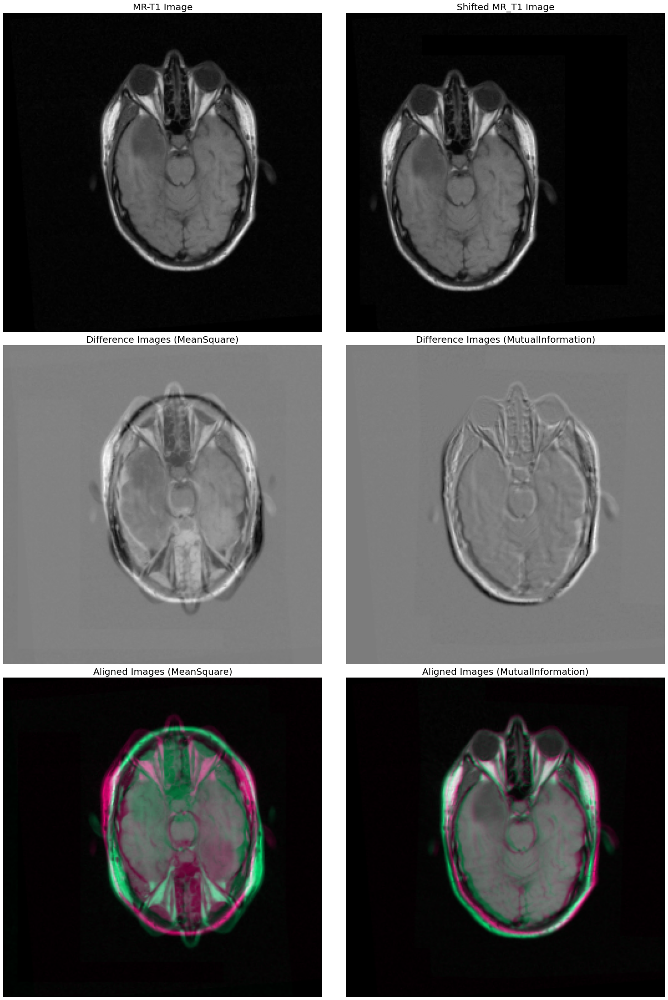

In [21]:
# https://www.insight-journal.org/rire/download_training_data.php
# https://itk.org/Wiki/SimpleITK/Tutorials/MICCAI2015
import SimpleITK as sitk
import matplotlib.pyplot as plt

fixed =  sitk.ReadImage("images/mr_T1_01.jpg", sitk.sitkFloat32)
moving = sitk.ReadImage("images/mr_T1_01_trans.jpg", sitk.sitkFloat32) 

R = sitk.ImageRegistrationMethod()
R.SetMetricAsMeanSquares()
R.SetOptimizerAsRegularStepGradientDescent(4.0, .01, 200 )
R.SetInterpolator(sitk.sitkLinear)
transfo = sitk.CenteredTransformInitializer(fixed, moving, sitk.Euler2DTransform())
R.SetInitialTransform(transfo)
outTx1 = R.Execute(fixed, moving)
print(outTx1)
print("Optimizer stop condition: {0}".format(R.GetOptimizerStopConditionDescription()))
print("Number of iterations: {0}".format(R.GetOptimizerIteration()))
R.SetMetricAsMattesMutualInformation(numberOfHistogramBins=50)
R.SetOptimizerAsRegularStepGradientDescent(4.0, .01, 200 )
R.SetInitialTransform(transfo)
outTx2 = R.Execute(fixed, moving)
print(outTx2)
print("Optimizer stop condition: {0}".format(R.GetOptimizerStopConditionDescription()))
print("Number of iterations: {0}".format(R.GetOptimizerIteration()))

#sitk.WriteTransform(outTx, 'transfo_final.tfm')
resampler = sitk.ResampleImageFilter()
resampler.SetReferenceImage(fixed)
resampler.SetInterpolator(sitk.sitkLinear)
resampler.SetDefaultPixelValue(100)
resampler.SetTransform(outTx1)
out1 = resampler.Execute(moving)
moving_image_array_trans1 = sitk.GetArrayFromImage(out1)
simg1 = sitk.Cast(sitk.RescaleIntensity(fixed), sitk.sitkUInt8)
simg2 = sitk.Cast(sitk.RescaleIntensity(out1), sitk.sitkUInt8)
cimg1_array = sitk.GetArrayFromImage(sitk.Compose(simg1, simg2, simg1//2.+simg2//2.))
resampler.SetTransform(outTx2)
out2 = resampler.Execute(moving)
moving_image_array_trans2 = sitk.GetArrayFromImage(out2)
simg1 = sitk.Cast(sitk.RescaleIntensity(fixed), sitk.sitkUInt8)
simg2 = sitk.Cast(sitk.RescaleIntensity(out2), sitk.sitkUInt8)
cimg2_array = sitk.GetArrayFromImage(sitk.Compose(simg1, simg2, simg1//2.+simg2//2.))
       
fixed_image_array = sitk.GetArrayFromImage(fixed)
moving_image_array = sitk.GetArrayFromImage(moving)
print(fixed_image_array.shape, moving_image_array.shape)
plt.figure(figsize=(20,30))
plt.gray()
plt.subplots_adjust(0,0,1,1,0.075,0.01)
plt.subplot(321), plt.imshow(fixed_image_array), plt.axis('off'), plt.title('MR-T1 Image', size=20)
plt.subplot(322), plt.imshow(moving_image_array), plt.axis('off'), plt.title('Shifted MR_T1 Image', size=20)
plt.subplot(323), plt.imshow(fixed_image_array - moving_image_array_trans1), plt.axis('off'), plt.title('Difference Images (MeanSquare)', size=20)
plt.subplot(324), plt.imshow(fixed_image_array - moving_image_array_trans2), plt.axis('off'), plt.title('Difference Images (MutualInformation)', size=20)
plt.subplot(325), plt.imshow(cimg1_array), plt.axis('off'), plt.title('Aligned Images (MeanSquare)', size=20)
plt.subplot(326), plt.imshow(cimg2_array), plt.axis('off'), plt.title('Aligned Images (MutualInformation)', size=20)
plt.show()

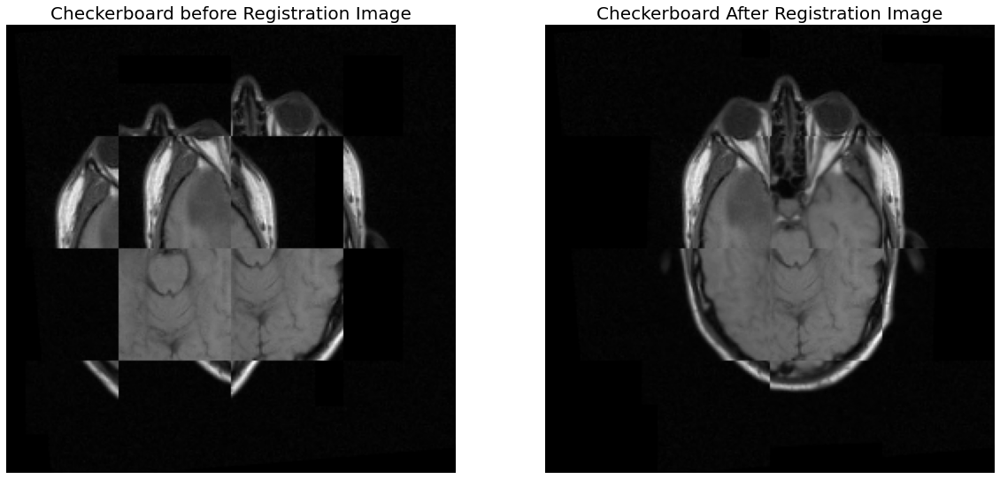

In [22]:
checkerboard = sitk.CheckerBoardImageFilter()
before_reg_image = checkerboard.Execute (fixed, moving)
after_reg_image = checkerboard.Execute (fixed, out2)
plt.figure(figsize=(20,10))
plt.gray()
plt.subplot(121), plt.imshow(sitk.GetArrayFromImage(before_reg_image)), plt.axis('off'), plt.title('Checkerboard before Registration Image', size=20)
plt.subplot(122), plt.imshow(sitk.GetArrayFromImage(after_reg_image)), plt.axis('off'), plt.title('Checkerboard After Registration Image', size=20)
plt.show()

## Korisni linkovi

## Reference

1.   [Python Image Processing Cookbook](https://www.amazon.com/Python-Image-Processing-Cookbook-processing-ebook/dp/B084ZN7Y5F), Sandipan Dey

2.   [Registration with ITK](https://www.cs.cmu.edu/~galeotti/methods_course/ITK_Registration.pdf)

3.   [SimpleITK Documentation](https://buildmedia.readthedocs.org/media/pdf/simpleitk/master/simpleitk.pdf)

4.   [Introduction to SimpleITKv4 Registration](http://insightsoftwareconsortium.github.io/SimpleITK-Notebooks/Python_html/60_Registration_Introduction.html)

5.   [Intensity-based Registration of Medical Images using Mutual Information Metric](https://www.youtube.com/watch?v=MaFiP6RerpM)

6.   [Motion Analysis and Object Tracking](https://docs.opencv.org/3.0-beta/modules/video/doc/motion_analysis_and_object_tracking.html)

7.   [Image Alignment (ECC) in OpenCV ( C++ / Python )](https://learnopencv.com/image-alignment-ecc-in-opencv-c-python/)

8.   [Face Alignment with OpenCV and Python](https://www.pyimagesearch.com/2017/05/22/face-alignment-with-opencv-and-python/)

9.   [Face Alignment](https://github.com/1adrianb/face-alignment/)

## TO DO

### Zadatak 1

- Na osnovu fotografije sa licem Mona Lize prisutnim dva puta u dve različite orijentacije, potrebno je koristiti detektor lica dlib biblioteke i prediktor oblika za otkrivanje lica zajedno sa orijentirima lica.

- Koristiti izvučene orijentacije lica za procenu afine transformacije (upotreba scikitimage). Zatim iskriviti levo lice na desno lice. 

- Kao izlaz bi trebalo dobiti figuru ako nacrtate otkrivena lica i iskrivljeno lice, zajedno sa izdvojenim orijentirima lica.

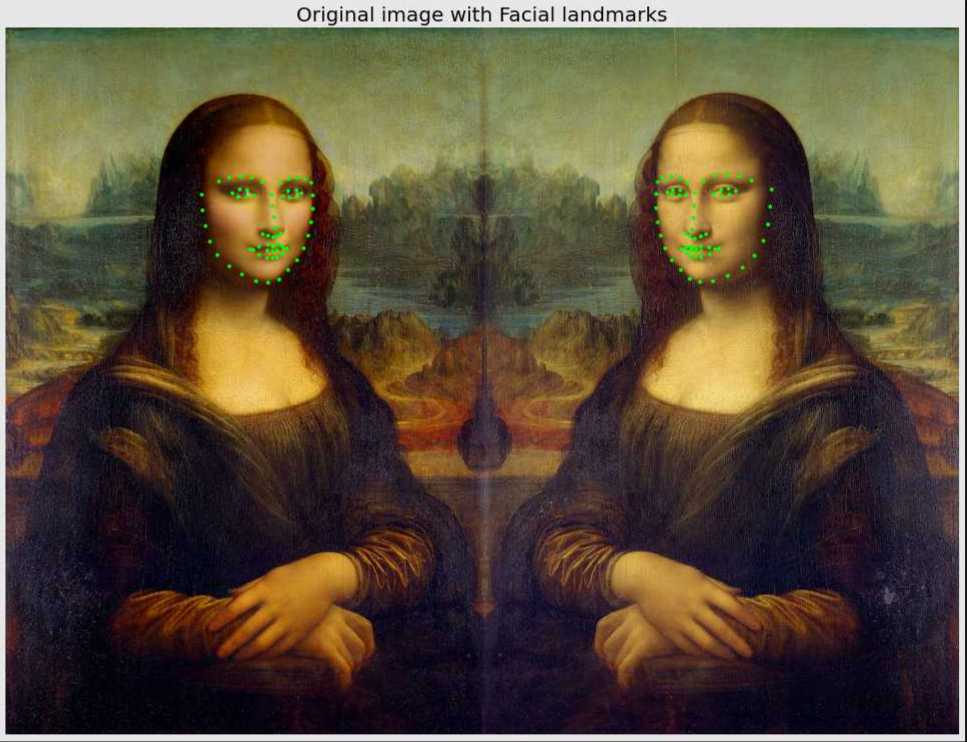

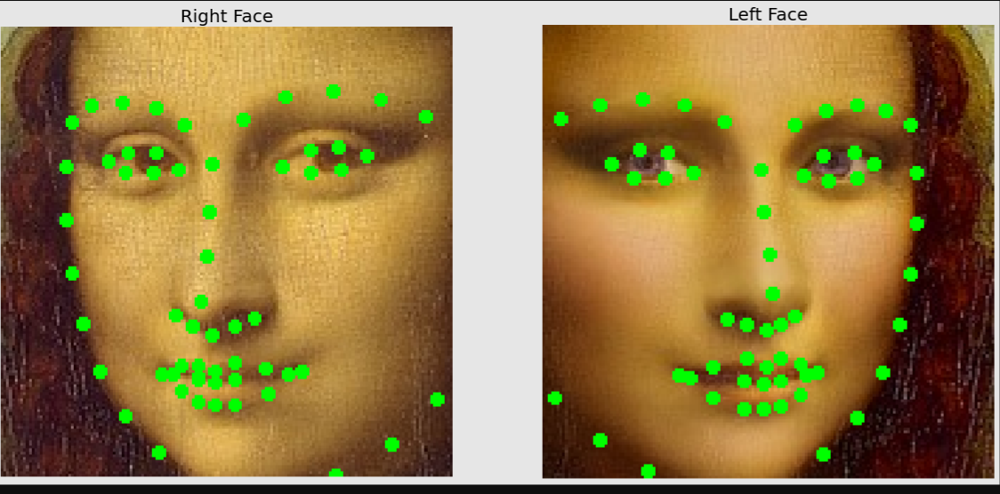

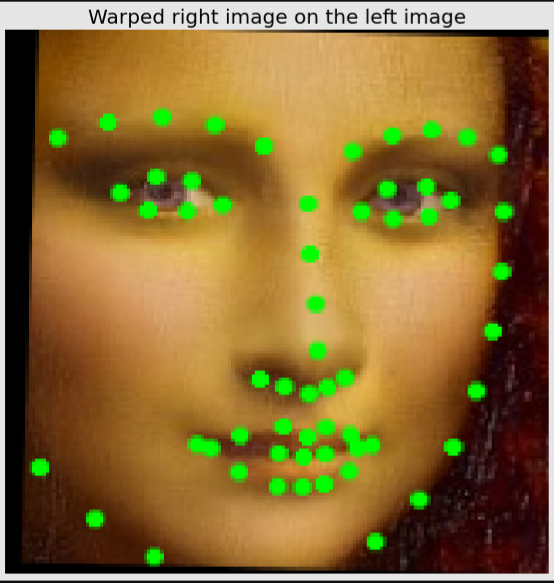